## Comparing White Space Tokenizer to BERT Tokenizer
White space tokenizers split text based on spaces, while BERT tokenizers are specifically designed to break text into subwords for better understanding in machine learning applications.

In this example, we tokenize a given sentence using a simple white space tokenizer by splitting the text wherever there is a space.

In [1]:
text = "BERT preprocessing is essential."

white_space_sentence = text.split()

print(white_space_sentence)

['BERT', 'preprocessing', 'is', 'essential.']


Here, we use the Hugging Face Transformers library to tokenize a sentence with the BERT tokenizer. This tokenizer breaks sentences into subword units by leveraging a pretrained vocabulary, allowing it to handle various linguistic nuances.

In [2]:
from transformers import BertTokenizer

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
text = "BERT preprocessing is essential."
tokens = tokenizer.tokenize(text)

print(tokens)

C:\Users\Utilizador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


['bert', 'prep', '##ro', '##ces', '##sing', 'is', 'essential', '.']


## Performing Text Classification with BERT
BERT can be fine-tuned for specific tasks, referred to as “downstream tasks,” such as sentiment analysis, named entity recognition, and more. During fine-tuning, BERT’s parameters are updated using labeled datasets for the specific task, allowing it to adapt and specialize without requiring training from scratch.

In [3]:
from transformers import BertForSequenceClassification, BertTokenizer
import torch

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained('bert-base-uncased')

text = "This movie was bad!"
inputs = tokenizer(text, return_tensors='pt')
outputs = model(**inputs)
predictions = torch.argmax(outputs.logits, dim=1)
print(predictions)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tensor([1])


## Understanding BERT Attention Mechanism
BERT uses bidirectional attention, meaning it considers the context from both preceding and succeeding words when processing a sentence. This approach allows BERT to generate embeddings rich with context, improving understanding at the sentence level.
In this example, we visualize BERT’s attention weights, which help determine how much focus BERT gives to each word in a sentence, providing insight into how BERT processes the text.



In [4]:
import torch
from transformers import BertModel, BertTokenizer

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

text = "BERT's attention mechanism is fascinating."
inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True)
outputs = model(**inputs, output_attentions=True)

attention_weights = outputs.attentions
print(attention_weights)

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


(tensor([[[[7.0430e-02, 4.7734e-02, 4.5779e-02,  ..., 9.7265e-02,
           1.3927e-01, 3.5823e-01],
          [3.6679e-02, 8.6646e-02, 4.3685e-02,  ..., 2.3391e-01,
           3.7266e-02, 6.5047e-02],
          [8.5532e-02, 1.3269e-01, 3.7626e-02,  ..., 1.2145e-01,
           1.1870e-01, 1.3301e-01],
          ...,
          [5.4352e-02, 1.2452e-01, 1.4481e-01,  ..., 1.2920e-01,
           1.0262e-01, 1.0715e-01],
          [8.2241e-02, 1.0184e-01, 9.4826e-02,  ..., 9.6448e-02,
           1.5859e-01, 1.1109e-01],
          [9.6005e-02, 6.8182e-02, 6.3413e-02,  ..., 1.3608e-01,
           1.7070e-01, 1.8861e-01]],

         [[6.8129e-01, 9.2499e-03, 2.2069e-01,  ..., 5.5413e-03,
           3.5570e-02, 7.2794e-03],
          [2.3929e-01, 5.2402e-02, 8.9530e-02,  ..., 1.1060e-01,
           1.2288e-01, 1.3781e-01],
          [1.9622e-02, 1.6688e-01, 1.2318e-02,  ..., 2.9411e-01,
           1.1144e-01, 3.4867e-02],
          ...,
          [1.6697e-01, 9.8040e-02, 3.0382e-02,  ..., 7.042

## The Masked Language Model (MLM) Objective in BERT
MLM is one of BERT’s primary training objectives. During pretraining, some words in a sentence are masked, and BERT uses the surrounding context to predict them. This process enables BERT to learn deep relationships between words, effectively capturing the meaning of text in context.

In [5]:
from transformers import BertForMaskedLM, BertTokenizer
import torch

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForMaskedLM.from_pretrained('bert-base-uncased')

text = "BERT is a powerful language model."
inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, add_special_tokens=True)
outputs = model(**inputs, labels=inputs['input_ids'])

loss = outputs.loss
print(loss)

BertForMaskedLM has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'c

tensor(4.0929, grad_fn=<NllLossBackward0>)


## Retracing Sentence Flow with Next Sentence Prediction (NSP)
NSP trains BERT to understand whether one sentence logically follows another in a pair of sentences. This helps BERT analyze the logical flow and relationship between sentences in larger contexts, which is essential for understanding paragraphs and constructing coherent language representations.



In [6]:
from transformers import BertTokenizer, BertForNextSentencePrediction
import torch

# Load pretrained BERT tokenizer and model
model = BertForNextSentencePrediction.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Here you have a positive example:

In [10]:


# Define sentence pairs
tokenized = tokenizer("What time is it?", "It is 2 am.", return_tensors="pt")

# Perform prediction
outputs = model(**tokenized)
logits = outputs.logits

# Display the prediction scores
print("Is next sentence:", torch.argmax(logits).item())

Is next sentence: 0


Here you have a negative example:

In [12]:
# Define sentence pairs
tokenized = tokenizer("BERT is a language model.", "It is a good approach for contextual inputs", return_tensors="pt")

# Perform prediction
outputs = model(**tokenized)
logits = outputs.logits

# Display the prediction scores
print("Is next sentence:", torch.argmax(logits).item())

Is next sentence: 0


## Embeddings with BERT

This exercise demonstrates the use of BERT for generating word embeddings.

Embeddings are numerical vector representations of words, capturing their semantic meanings, and are widely used in NLP tasks.



In [13]:
from transformers import BertTokenizer, BertModel
import torch

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased',output_hidden_states=True)

text = "BERT embeddings are fascinating."
inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True, add_special_tokens=True)
outputs = model(**inputs)

word_embeddings = outputs.last_hidden_state
print(word_embeddings)

tensor([[[-0.1094,  0.2831, -0.2219,  ..., -0.4116,  0.2604,  0.4303],
         [ 0.3717,  0.0461,  0.3014,  ..., -0.2603, -0.2263,  0.0782],
         [-0.2072,  0.3525, -0.2668,  ..., -0.0065, -0.6920, -0.0067],
         ...,
         [ 0.5834,  0.4004,  0.4881,  ..., -0.1181,  0.2630, -0.1225],
         [ 0.0716, -0.2377, -0.3874,  ...,  0.2981,  0.0436, -0.6352],
         [ 0.8747,  0.4112, -0.3423,  ...,  0.2614, -0.4867, -0.2898]]],
       grad_fn=<NativeLayerNormBackward0>)


In [14]:
outputs.hidden_states[0]

tensor([[[ 0.1686, -0.2858, -0.3261,  ..., -0.0276,  0.0383,  0.1640],
         [ 0.9295,  0.5056,  0.4276,  ...,  0.9511,  0.7785, -0.2679],
         [-0.4050, -0.9069, -1.0731,  ...,  0.2984,  0.5342, -0.4000],
         ...,
         [ 0.9710,  0.2375,  0.3694,  ..., -0.1499,  0.0917,  0.4459],
         [-0.1550,  0.0692, -0.1660,  ...,  0.4387,  0.6441,  0.5938],
         [-0.1474, -0.0411, -0.0732,  ..., -0.1157,  0.0421, -0.0550]]],
       grad_fn=<NativeLayerNormBackward0>)

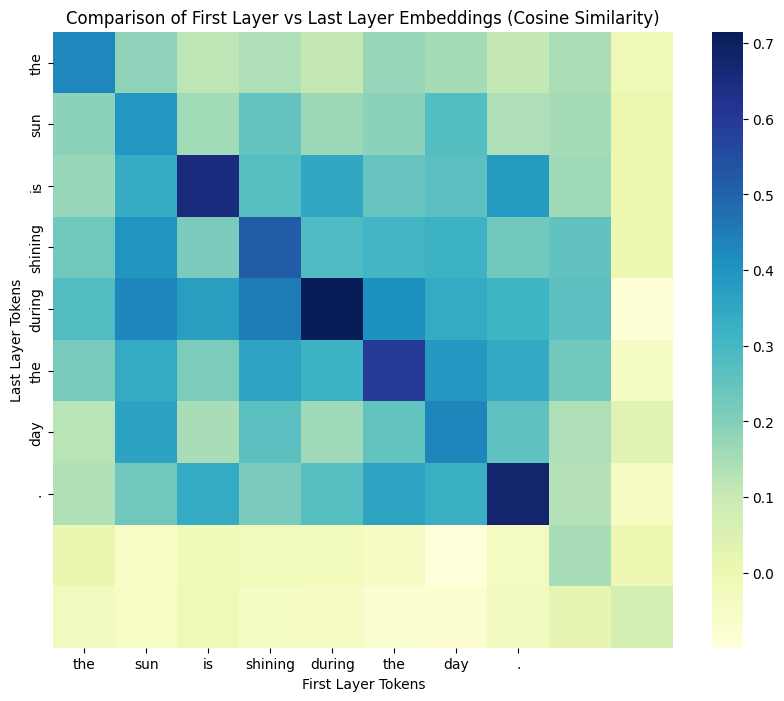

In [15]:
from transformers import BertModel, BertTokenizer
import torch
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load pre-trained BERT model and tokenizer
model_name = "bert-base-uncased"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name, output_hidden_states=True)

# Example input text
text = "The sun is shining during the day."
inputs = tokenizer(text, return_tensors="pt", padding=True, truncation=True)

# Forward pass through the model
outputs = model(**inputs)
hidden_states = outputs.hidden_states

# Extract first and last layer embeddings
first_layer_embeddings = hidden_states[9]  # First layer embeddings
last_layer_embeddings = hidden_states[-1]  # Last layer embeddings

# Convert to numpy arrays for comparison
first_layer = first_layer_embeddings[0].detach().numpy()  # Shape: (sequence_length, hidden_size)
last_layer = last_layer_embeddings[0].detach().numpy()  # Shape: (sequence_length, hidden_size)


# Compute similarity matrix (cosine similarity between tokens across layers)
def cosine_similarity(a, b):
    return np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))


# Create similarity matrix with all tokens in first layer (x-axis) vs last layer (y-axis)
similarity_matrix = np.zeros((last_layer.shape[0], first_layer.shape[0]))
for i in range(last_layer.shape[0]):  # Iterate over tokens in last layer
    for j in range(first_layer.shape[0]):  # Iterate over tokens in first layer
        similarity_matrix[i, j] = cosine_similarity(last_layer[i], first_layer[j])

# Tokenized text for axis labels
tokens = tokenizer.tokenize(text)

# Plot heatmap
plt.figure(figsize=(10, 8))  # Adjust size as needed
sns.heatmap(similarity_matrix, annot=False, cmap="YlGnBu", xticklabels=tokens, yticklabels=tokens)
plt.title("Comparison of First Layer vs Last Layer Embeddings (Cosine Similarity)")
plt.xlabel("First Layer Tokens")
plt.ylabel("Last Layer Tokens")
plt.show()


## Visualizing Attention in BERT with Neuron View

In this exercise, we will use the `bertviz.neuron_view` tool to visualize how BERT attends to different words in a text. By analyzing the attention outputs for a specific layer and head, we can observe how tokens within two sentences interact.

The visualization focuses on Layer 10 and Head 0, allowing us to explore the patterns in BERT's attention mechanism when comparing the sentences: *"The cat sat on the mat"* and *"The cat lay on the rug"*. This exercise showcases the interpretability of BERT's attention across specific layers and heads, offering insight into its contextual understanding.

In [17]:
%pip install bertviz
# Import specialized versions of models (that return query/key vectors)
from bertviz.transformers_neuron_view import BertModel, BertTokenizer
from bertviz.neuron_view import show

model_type = 'bert'
model_version = 'bert-base-uncased'
do_lower_case = True
sentence_a = "The cat sat on the mat"
sentence_b = "The cat lay on the rug"
model = BertModel.from_pretrained(model_version, output_attentions=True)
tokenizer = BertTokenizer.from_pretrained(model_version, do_lower_case=do_lower_case)
show(model, model_type, tokenizer, sentence_a, sentence_b, layer=10, head=0)

   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
    --------------------------------------- 0.3/13.3 MB ? eta -:--:--
   -- ------------------------------------- 0.8/13.3 MB 1.8 MB/s eta 0:00:08
   --- ------------------------------------ 1.0/13.3 MB 1.5 MB/s eta 0:00:09
   ---- ----------------------------------- 1.6/13.3 MB 1.9 MB/s eta 0:00:07
   ---- ----------------------------------- 1.6/13.3 MB 1.9 MB/s eta 0:00:07
   ------ --------------------------------- 2.1/13.3 MB 1.6 MB/s eta 0:00:07
   ------- -------------------------------- 2.6/13.3 MB 1.7 MB/s eta 0:00:07
   -------- ------------------------------- 2.9/13.3 MB 1.7 MB/s eta 0:00:07
   -------- ------------------------------- 2.9/13.3 MB 1.7 MB/s eta 0:00:07
   --------- ------------------------------ 3.1/13.3 MB 1.5 MB/s eta 0:00:07
   ---------- ----------------------------- 3.4/13.3 MB 1.5 MB/s eta 0:00:07
   ----------- ---------------------------- 3.7/13.3 MB 1.5 MB/s eta 0:00:07
   ----------

100%|██████████| 440473133/440473133 [12:41<00:00, 578511.04B/s] 
C:\Users\Utilizador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\bertviz\transformers_neuron_view\modeling_utils.py:482: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case w

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>